In [193]:
import matplotlib.pyplot as plt
import folium
import geopandas as gpd
import pandas as pd
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable
%matplotlib inline

In [186]:
# Reading file
file = open("daily_cases.csv").readlines()
file = list(map(lambda x: x.split(";"), file))

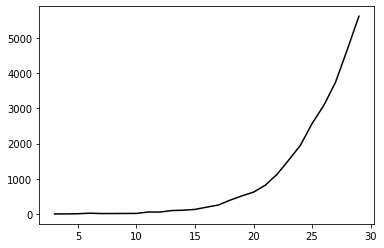

In [187]:
# Per day plot
days_cases = {}
for i in range(1, len(file)):
    line = file[i]
    if int(line[0]) in days_cases:
        days_cases[int(line[0])] += 1
    else:
        days_cases[int(line[0])] = 1

days = list(days_cases.keys())
cases = list(days_cases.values())
plt.plot(days, cases, 'k')
plt.show()

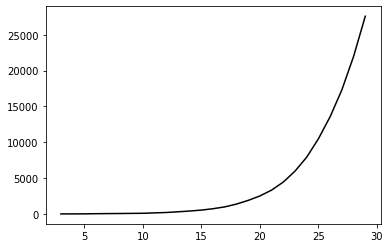

In [188]:
acum = [cases[0]]
for i in range(1, len(cases)):
    acum.append(acum[i - 1] + cases[i])

plt.plot(days, acum, 'k')
plt.show()

In [222]:
# Read cases per zone
zones = {}
for line in file[1:]:
    line_we = int(line[1].replace("\n", ""))
    if line_we in zones:
        zones[line_we] += 1
    else:
        zones[line_we] = 1

In [224]:
# Create new geopandas data frame
urban_zones = gpd.read_file("maps/EOD.shp")

new_df = []
for _, rows in urban_zones.iterrows():
    id_sit = int(rows['SIT_2017'])
    if id_sit not in zones:
        zones[id_sit] = 0
    new_df.append({'geometry' : rows['geometry'], 'sit': id_sit, 'cases': zones[id_sit]})

gdf = gpd.GeoDataFrame(new_df)

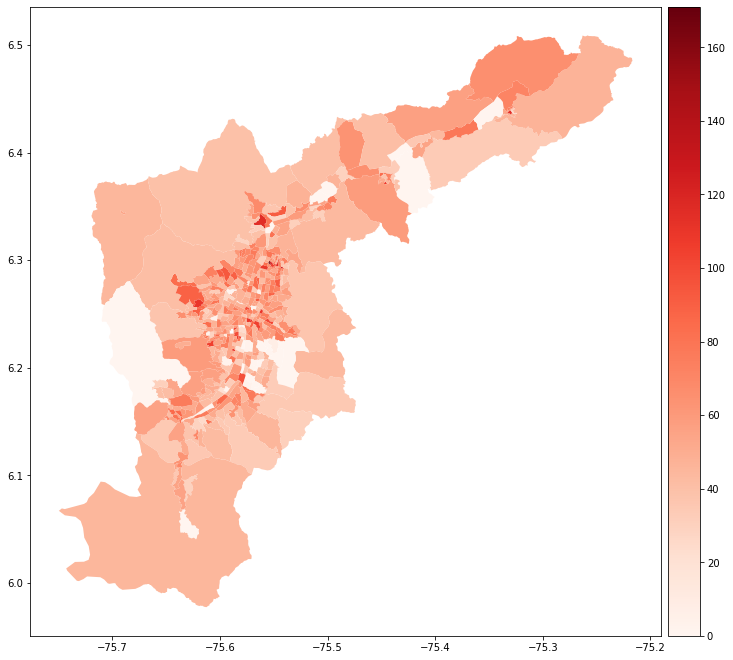

In [225]:
_, ax = plt.subplots(1, 1, figsize=(12, 12))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

gdf.plot(column='cases', ax=ax, legend=True, cmap='Reds', cax=cax)
plt.show()

# Folium Attempt

In [227]:
# Create csv file
csv = open("dcf.csv", "w")
csv.write("Zone,Cases\n")
for zone in zones:
    csv.write(str(zone) + "," + str(zones[zone]) + "\n")
csv.close()

# Create json file
json_file = open("maps/eod.json", "w")
json_file.write(gdf.to_json())
json_file.close()

In [232]:
# Data reading
geojson = "maps/eod.json"
cases = 'dcf.csv'
csv_file = pd.read_csv(cases)

# Folium rendering
m = folium.Map(location=[6.2696021,-75.6065468], zoom_start=10)

folium.Choropleth(
    geo_data=geojson,
    data=csv_file,
    name='choropleth',
    columns=['Zone', 'Cases'],
    key_on='feature.properties.sit',
    fill_color='Reds',
    line_opacity=0.2,
    fill_opacity=0.9,
    legend_name='COVID-19 Cases'
).add_to(m)

m